# Лекция 1. Преобразования изображений и подавление шума

## Полезные ссылки

  - http://scikit-image.org/docs/dev/auto_examples/    -- библиотека для `Python` для работы с изображениями
  - http://docs.scipy.org/doc/scipy/reference/tutorial/ndimage.html -- раздел большой библиотеки `SciPy` для работы с n-мерными изображениями
  - http://opencv.org/ --`OpenCV`, библиотека (с поддержкой `Python` и др. языков) для работы с изображениями в контексте "машинного зрения"
  - http://imagej.nih.gov/ij/ -- `Imagej`, довольно популярная (свободно распространяемая) программа для работы с научными изображениями
  - http://www.bitplane.com/imaris -- `Imaris`, довольно дорогая проприетарная программа для управления микроскопами и обработки изображений
  


## План
  1. <font color='maroon'>"Вспомнить" Python</font>
  2. Что такое изображение (массив чисел или векторов)
  3. Фильтрация изображений: локальные фильтры
     - локальные средние
     - размытие по Гауссу (взвешенные средние)
     - 
     - Многомасштабные пирамиды фильтров (?)
  4. Фильтрация изображений: пространства преобразований
     - 2D FFT и похожие (DCT)
     - преобразование Хафа (Hough transform)
     - преобразование Радона (Radon transform)


Простые алгоритмы мы попытаемся реализовать по ходу дела, более сложные возьмем из готовых библиотек. Какие изображения использовать? Какие задачи решать?

<font color=darkgray>
## Next episodes...
  - Сегментация изображений и активные контуры
  - Фильтр Кальмана и (возможно) трекинг объектов
  - Детекция особенностей динамики в видеоизображениях

-------------

In [1]:
# We don't need interactive plots in this lecture, so use inline backend
%pylab inline

Populating the interactive namespace from numpy and matplotlib


In [2]:
style.use('ggplot')
rc('image', aspect='equal', cmap='gray') 
rc('figure', figsize=(10,10))
rc('grid', c='0.5', ls='..', lw=0.5)

In [3]:
from scipy import ndimage

In [4]:
import skimage

## Наша маленькая библиотека изображений-примеров

In [5]:
img_path = 'images/'
files = !ls $img_path

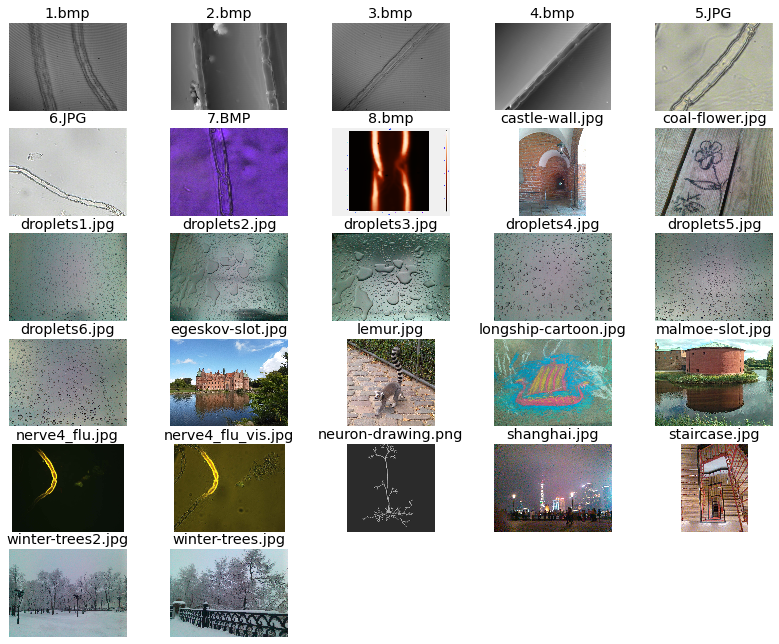

In [6]:
f, axs = subplots(6,5,figsize=(14,11))
images = (imread(img_path+f) for f in files)
for img,name,ax in zip(images,files, ravel(axs)):
    ax.imshow(img)
    setp(ax, title=name, frame_on=False, xticks=[],yticks=[])

for ax in ravel(axs)[len(files):]:
    ax.set_visible(False)

In [7]:
slot = imread('images/egeskov-slot.jpg')

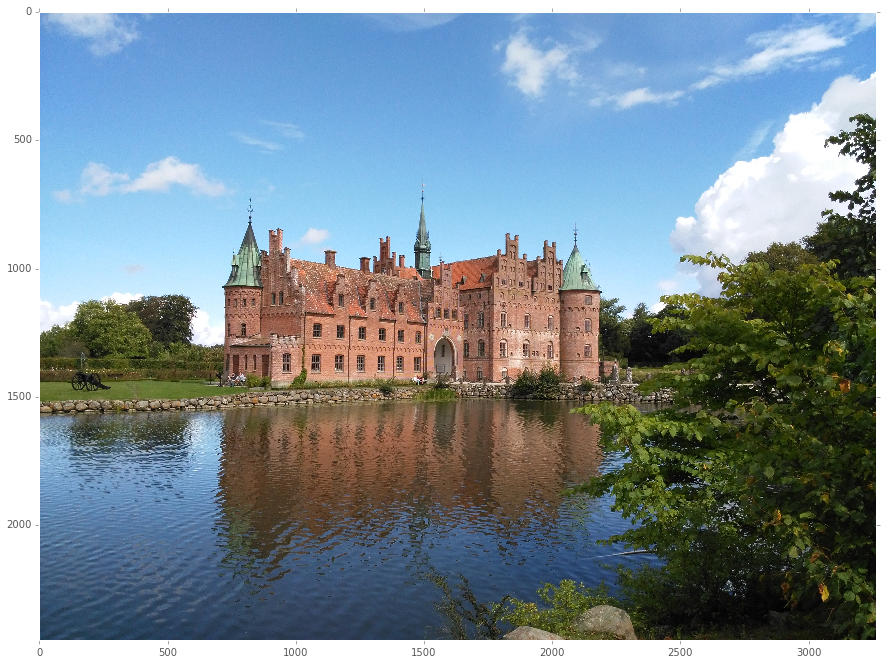

In [8]:
figure(figsize=(15,20))
imshow(slot)

In [9]:
slot.shape

(2448, 3264, 3)

Crop the image:

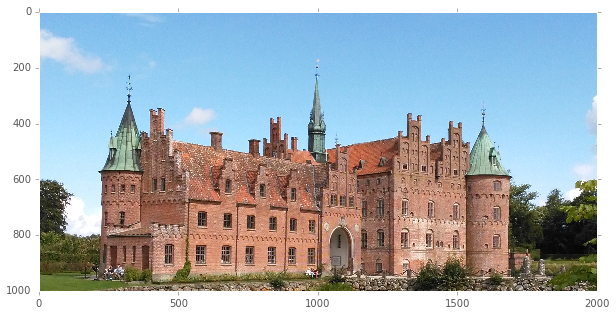

In [10]:
slot = slot[500:1500,500:2500,...]

imshow(slot)

Convert the image to grayscale values

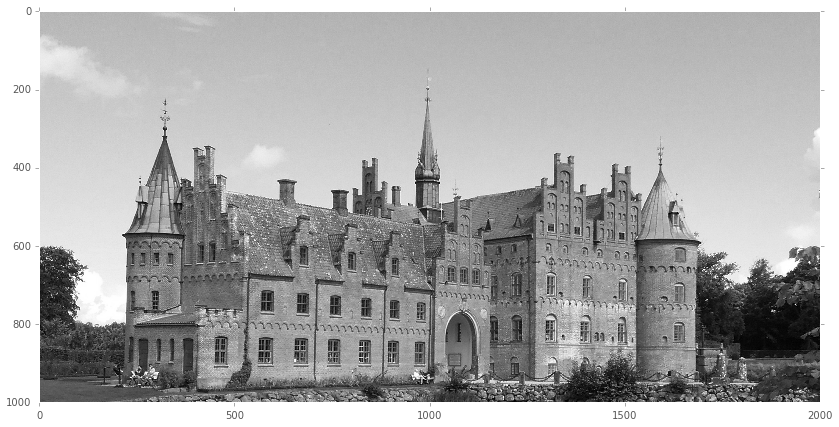

In [11]:
slot_gray = slot.mean(axis=-1)

figure(figsize=(14,7))
imshow(slot_gray)

Some simple statistics on pixel intensities:


In [12]:
print tuple('{}: {:2.2f}'.format(fn.func_name,fn(slot_gray)) for fn in (amin, amax, std))

('amin: 0.00', 'amax: 255.00', 'std: 57.28')


Corrupt the image with Gaussian white noise

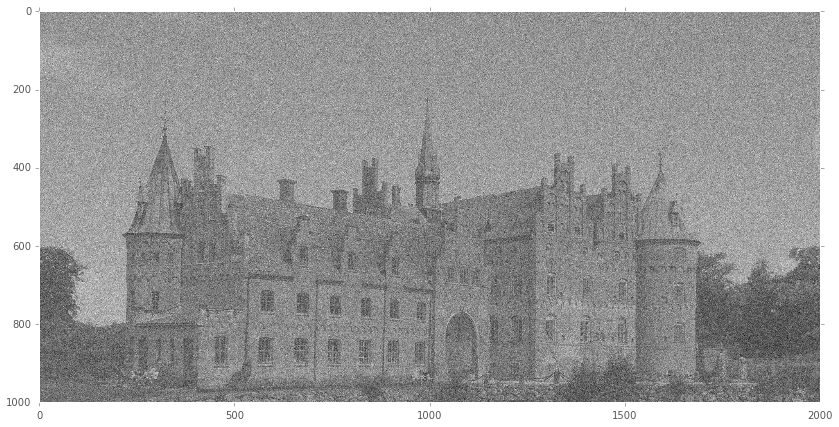

In [13]:
slot_noisy = slot_gray + randn(*slot_gray.shape)*std(slot_gray)
figure(figsize=(14,7))
imshow(slot_noisy)

##  Фильтрация изображений: локальные фильтры

### Локальные средние

In [14]:
def local_means(img, hw=3):
    out_img = np.zeros(img.shape)
    for row in xrange(hw,img.shape[0]-hw):
        for col in xrange(hw,img.shape[1]-hw):
            out_img[row,col] = img[row-hw:row+hw,col-hw:col+hw].mean()
    return out_img[hw:-hw,hw:-hw]

In [15]:
%time slot_lm = local_means(slot_gray, 15)
print slot_lm.shape

CPU times: user 12.7 s, sys: 0 ns, total: 12.7 s
Wall time: 12.7 s
(970, 1970)


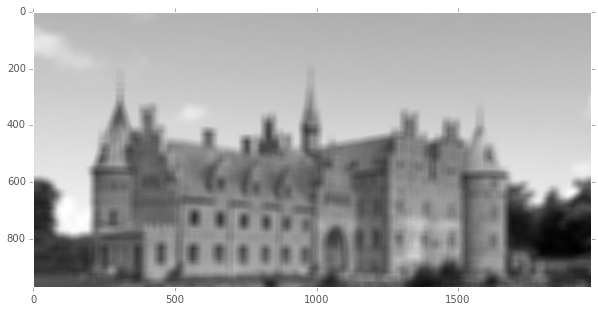

In [16]:
imshow(slot_lm)

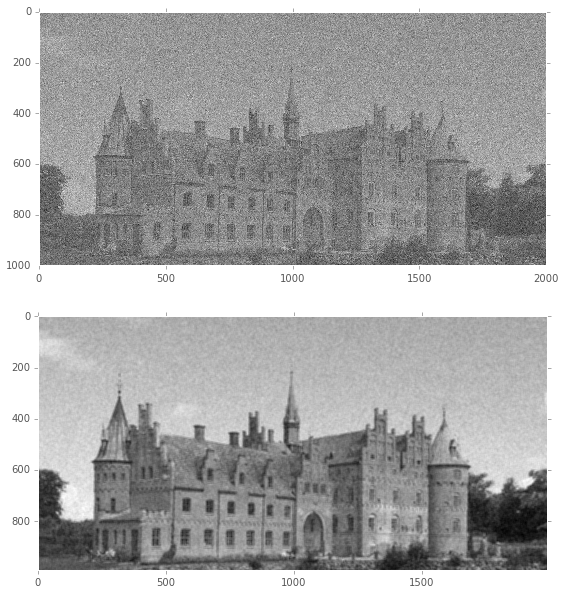

In [17]:
slot_lm = local_means(slot_noisy, 5)

subplot(2,1,1); imshow(slot_noisy)
subplot(2,1,2); imshow(slot_lm)

** Ускоряем при помощи `numba`**

In [18]:
from numba import jit

In [19]:
f = jit(local_means)
%time x = f(slot_noisy, 5)

CPU times: user 13.1 s, sys: 108 ms, total: 13.2 s
Wall time: 13.1 s


Нет, так не работает...

In [20]:
@jit
def local_means_numba(img, hw=3):
    "faster version of local means"
    nrows,ncols = img.shape
    out_img = np.zeros((nrows,ncols))
    #acc = np.zeros((hw*2)**2)
    for row in xrange(hw,nrows-hw):
        for col in xrange(hw,ncols-hw):
            acc,k = 0.0,0
            for i in xrange(-hw,hw):
                for j in xrange(-hw,hw):
                    acc += img[i+row,j+col]
                    k +=1
            out_img[row,col] = acc/k
    return out_img[hw:nrows-hw, hw:ncols-hw]

In [21]:
%time slot_lm2 = local_means_numba(slot_noisy, 5)

CPU times: user 468 ms, sys: 8 ms, total: 476 ms
Wall time: 452 ms


In [22]:
# второй раз выполняется немного быстрее, потому что функция уже скомпилирована
%time slot_lm2 = local_means_numba(slot_noisy, 5)

CPU times: user 208 ms, sys: 0 ns, total: 208 ms
Wall time: 207 ms


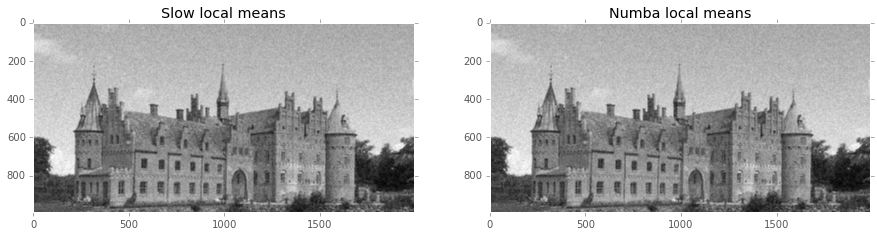

In [23]:
f, axs = subplots(1,2, figsize=(15,6))
axs[0].imshow(slot_lm)
axs[0].set_title('Slow local means')
axs[1].imshow(slot_lm2)
axs[1].set_title('Numba local means')

/home/brazhe/opt/anaconda/lib/python2.7/site-packages/matplotlib/collections.py:590: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self._edgecolors == str('face'):


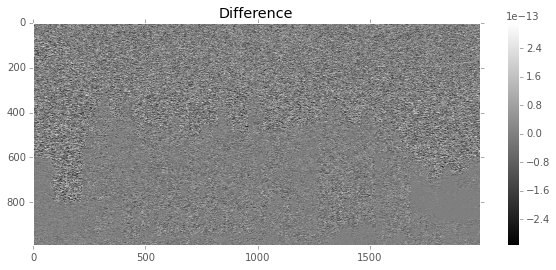

In [24]:
figure(figsize=(10,4))
imshow(slot_lm-slot_lm2); colorbar()
title('Difference')

Как можно видеть, результаты идентичны

###  Фильтр (размытие) Гаусса

In [25]:
%time slot_g1 = ndimage.gaussian_filter(slot_noisy, 3)

CPU times: user 60 ms, sys: 52 ms, total: 112 ms
Wall time: 56.8 ms


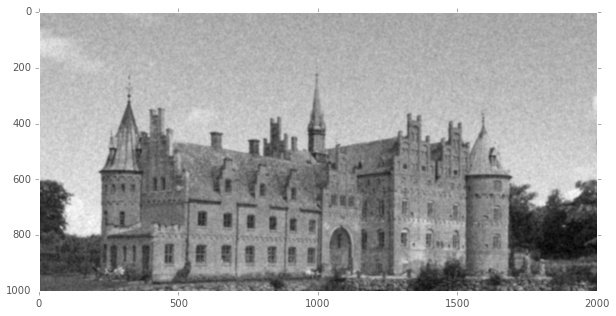

In [26]:
imshow(slot_g1)

Другой способ размещения нескольких осей на одной картинке

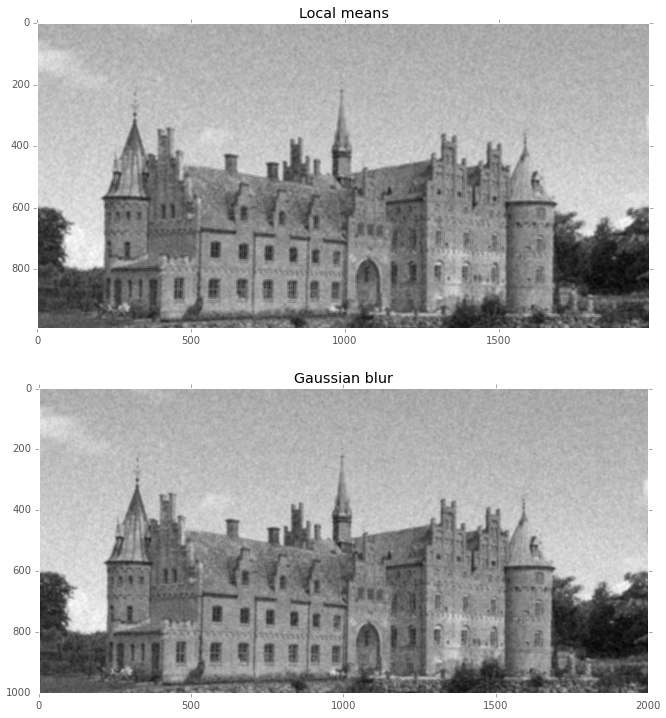

In [27]:
f, axs = subplots(2,1, figsize=(12,12))
axs[0].imshow(slot_lm2); axs[0].set_title('Local means')
axs[1].imshow(slot_g1); axs[1].set_title('Gaussian blur')

<matplotlib.colorbar.Colorbar instance at 0x7fc0cdf17f38>

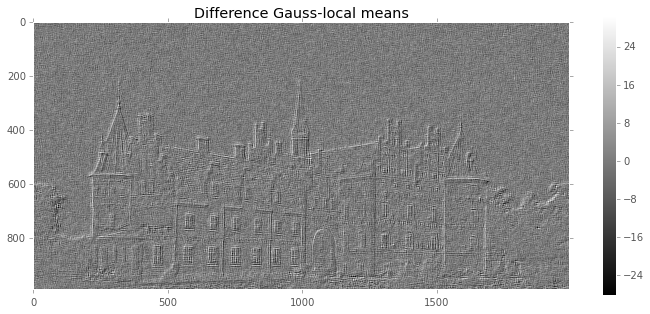

In [28]:
figure(figsize=(12,5))
imshow(slot_lm2-slot_g1[5:-5,5:-5])
title('Difference Gauss-local means')
colorbar()

<font color='red'> Контрольный вопрос: почему разница так выглядит?</font>

### Наша  реализация фильтра Гаусса

Используем `numba` для ускорения. Используем "зеркальные" граничные условия, т.е. там, где ядро фильтра выходит за границы изображения. 

In [29]:
@jit
def mirrorpd(i,N):
    "mirror boundary/padding conditions"
    if i < 0: return -i%N
    elif i>=N: return N-2-i%N
    else: return i


@jit            
def filt2d(u, kern):
    uout = np.zeros_like(u)
    (Nr,Nc),(kern_r,kern_c) = u.shape,kern.shape
    ind_r = arange(kern_r)-kern_r//2
    ind_c = arange(kern_c)-kern_c//2
    for i in xrange(Nr):
        for j in xrange(Nc):
            uout[i,j] = 0   # just in case :)
            for k in xrange(kern_r):
                ki = mirrorpd(i + ind_r[k], Nr)
                for l in xrange(kern_c):
                    li = mirrorpd(j + ind_c[l], Nc)
                    uout[i,j] += kern[k,l]*u[ki,li]    
    return uout

In [30]:
def make_gauss_kern(size=8, sigma=3.):
    x,y = mgrid[-size/2.+0.5:size/2.+.5,-size/2.+.5:size/2.+.5]
    sigma = float(sigma)
    g = np.exp(-(0.5*(x/sigma)**2 + 0.5*(y/sigma)**2))
    return g/g.sum()

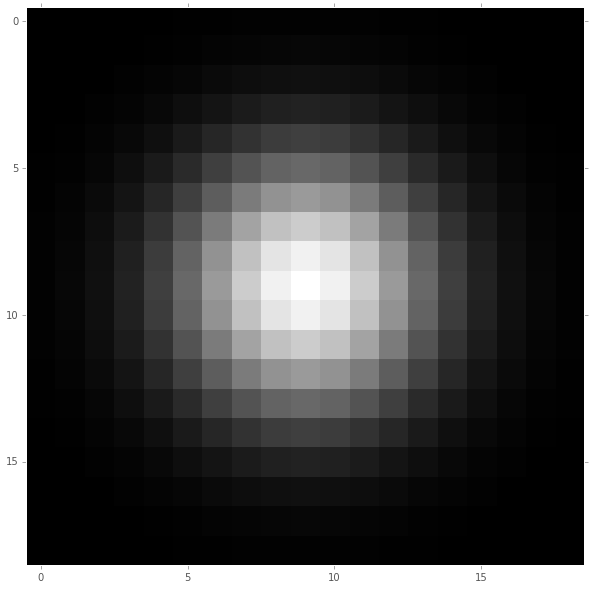

In [31]:
gk = make_gauss_kern(19,3)
imshow(gk,interpolation='nearest')

In [32]:
%time x = filt2d(slot_noisy, gk)

CPU times: user 1.65 s, sys: 104 ms, total: 1.76 s
Wall time: 1.64 s


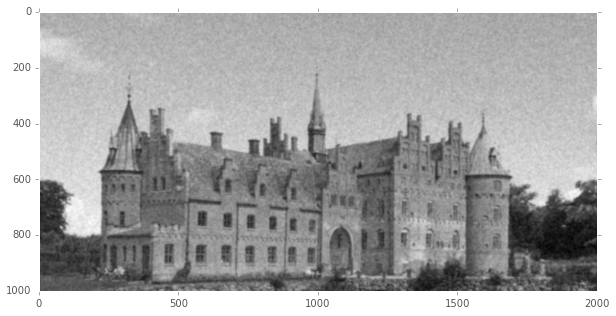

In [33]:
imshow(x)

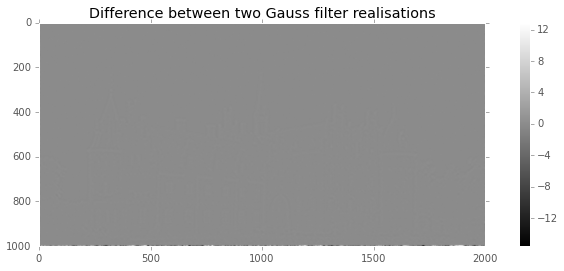

In [34]:
figure(figsize=(12,4))
imshow(slot_g1 - x); colorbar()
title("Difference between two Gauss filter realisations")

## Медианный фильтр

In [35]:
slot_median = ndimage.median_filter(slot_noisy,11)

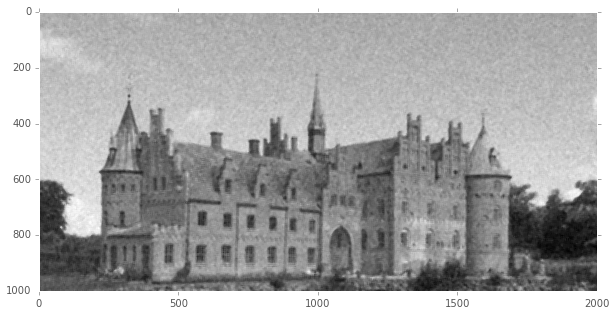

In [36]:
imshow(slot_median)

In [37]:
# Когда медианный фильтр лучше, чем локальные средние?
# salt and pepper noise

In [38]:
@jit
def local_medians(img, hw=3):
    out_img = np.zeros(img.shape)
    for row in xrange(hw,img.shape[0]-hw):
        for col in xrange(hw,img.shape[1]-hw):
            out_img[row,col] = median(img[row-hw:row+hw,col-hw:col+hw])
    return out_img[hw:-hw,hw:-hw]

In [39]:
%time slot_median2 = local_medians(slot_noisy, 5)

CPU times: user 45.5 s, sys: 0 ns, total: 45.5 s
Wall time: 45.5 s


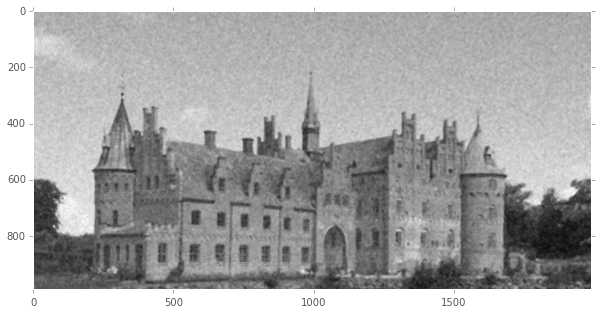

In [40]:
imshow(slot_median2)

## Фурье-преобразование изображений

In [41]:
img = imread('images/1.bmp').mean(axis=-1)
#img = ndimage.gaussian_filter(img, 3)[::5,::5]

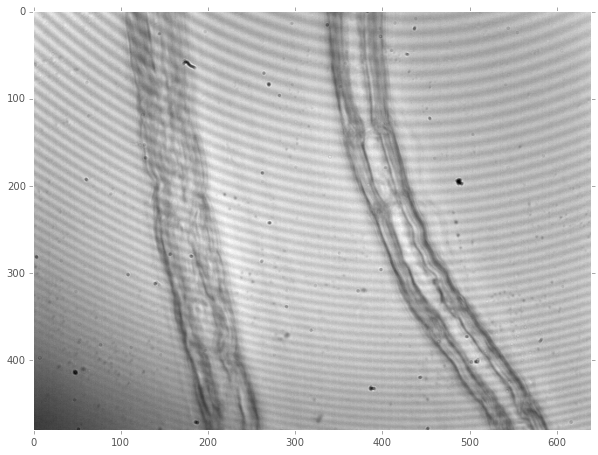

In [42]:
imshow(img)

In [43]:
out = fft2(img)
out = fftshift(out)

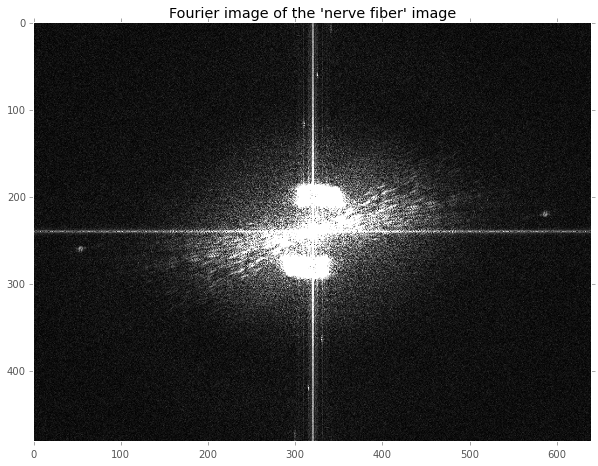

In [44]:
imshow(abs(out),clim=(0,1e4))
title("Fourier image of the 'nerve fiber' image")

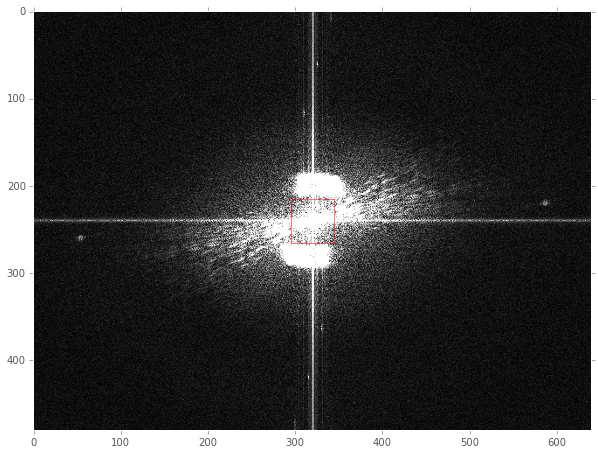

In [45]:
out2 = zeros(out.shape) + 1j
hw = 25
out2[240-hw:240+hw,320-hw:320+hw] = out[240-hw:240+hw,320-hw:320+hw]
imshow(abs(out), clim=(0,1e4))
gca().add_patch(Rectangle((320-hw,240-hw), 2*hw, 2*hw, facecolor='none', edgecolor='red'))

In [46]:
img2 = ifft2(ifftshift(out2))

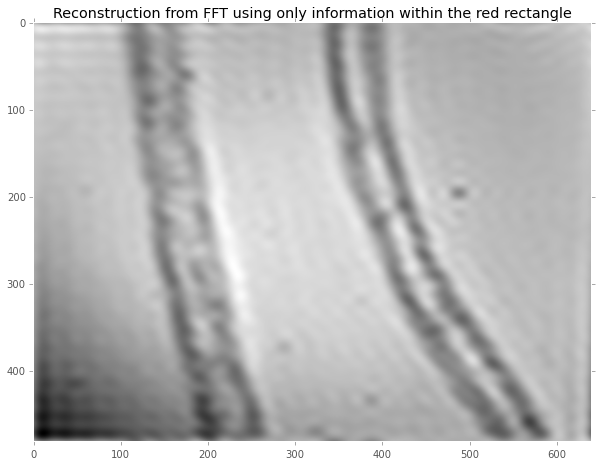

In [47]:
imshow(img2.real)
title('Reconstruction from FFT using only information within the red rectangle')

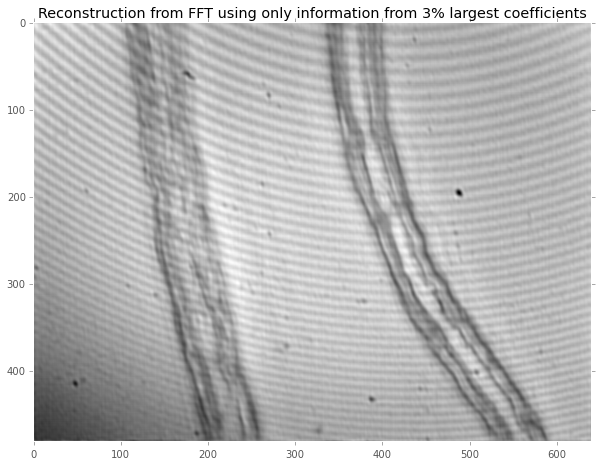

In [48]:
mask = abs(out) >= percentile(abs(out), 95)

img3 = ifft2(ifftshift(out*mask))

#figure()
#imshow(mask, cmap='jet')

figure()
imshow(img3.real)
title('Reconstruction from FFT using only information from 3% largest coefficients')

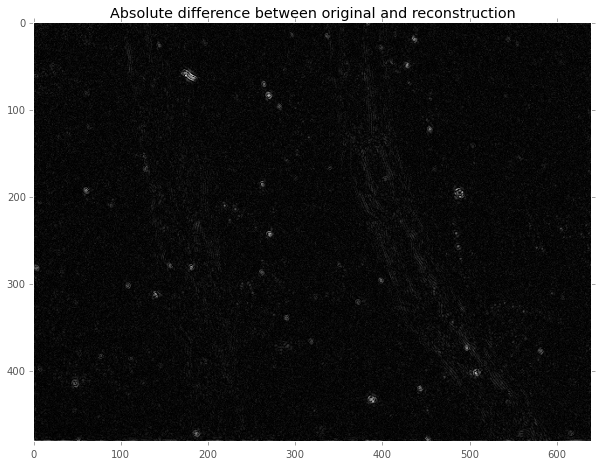

In [49]:
imshow(abs(img-img3.real)); title('Absolute difference between original and reconstruction')

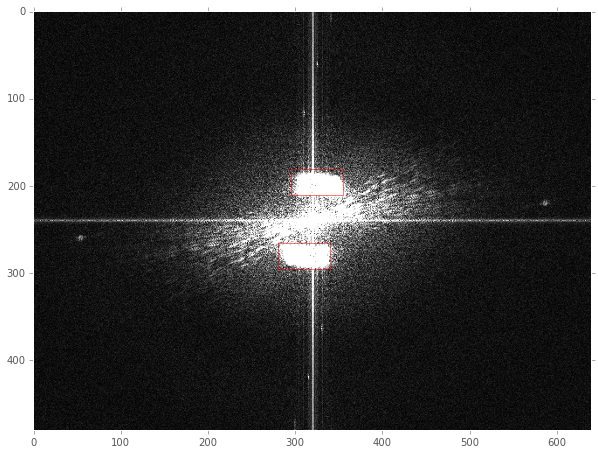

In [50]:
out2 = zeros(out.shape) + 1j
r1 = Rectangle((320-25, 240-60), 60, 30, color='red', fc='none')
r2 = Rectangle((320-40, 240+25), 60, 30, color='red', fc='none')

imshow(abs(out), clim=(0,1e4))
gca().add_patch(r1)
gca().add_patch(r2)

In [51]:
b1 = array(r1.get_bbox())
b2 = array(r2.get_bbox())

print 'b1:', b1
print 'b2:', b2

b1: [[ 295.  180.]
 [ 355.  210.]]
b2: [[ 280.  265.]
 [ 340.  295.]]


In [52]:
mask = np.ones(out.shape)

mask[180:210,295:355,] = 0
mask[265:295,280:340,] = 0

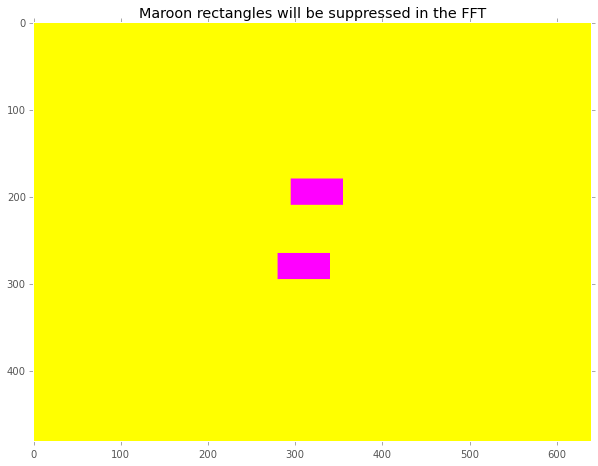

In [53]:
imshow(mask, cmap='spring'); title('Maroon rectangles will be suppressed in the FFT')

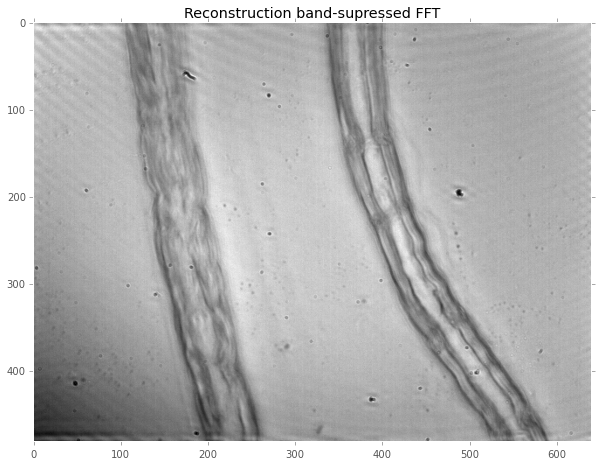

In [54]:
out2 = out*mask
img2 = ifft2(ifftshift(out2))
imshow(img2.real)
title('Reconstruction band-supressed FFT')

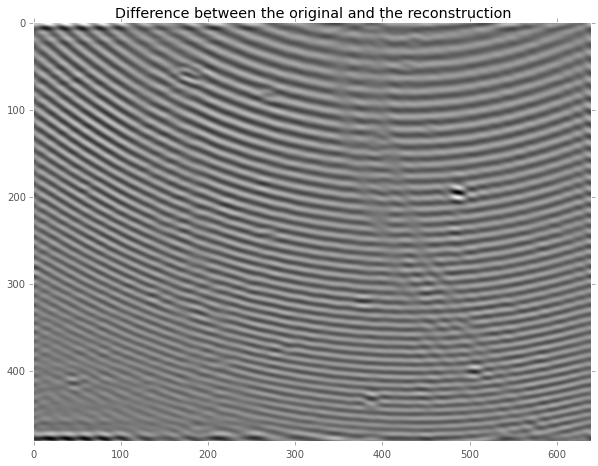

In [55]:
imshow(img-img2.real); title("Difference between the original and the reconstruction")

### DCT: похоже на FFT, но возвращает действительные  значения

In [56]:
from scipy.fftpack import dct, idct
def dct2d(m,norm='ortho'):
    return dct(dct(m, norm=norm, axis=0), 
               norm=norm, axis=1)
def dct2d(m,norm='ortho'):
    return dct(dct(m, norm=norm, axis=0), 
               norm=norm, axis=1)    

def idct2d(m,norm='ortho'):
    return idct(idct(m, norm=norm, axis=0), 
               norm=norm, axis=1) 

In [57]:
out = dct2d(img)

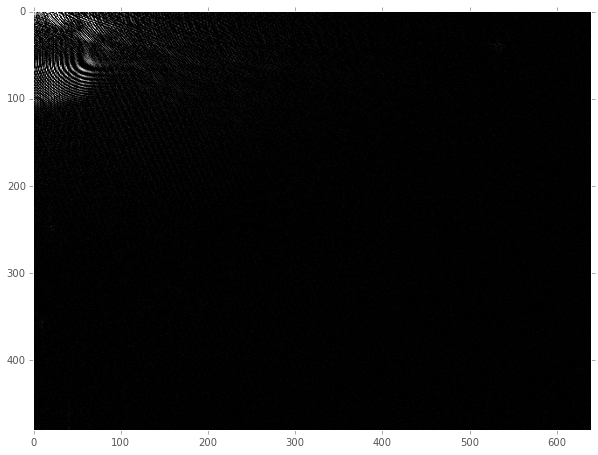

In [58]:
imshow(out, clim=(0,100))

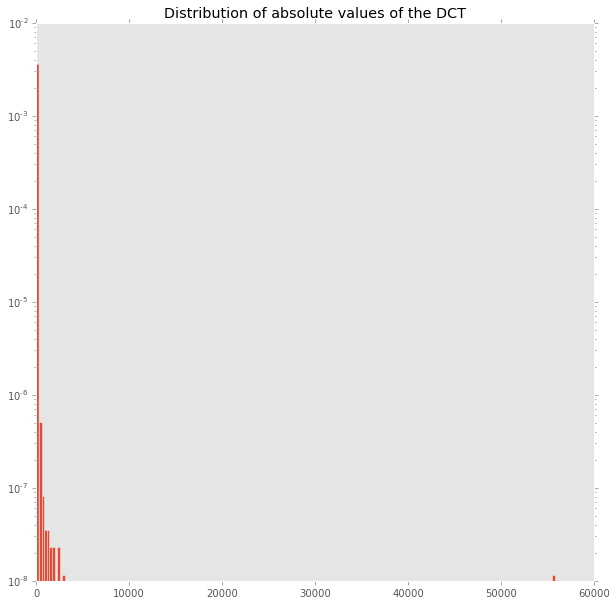

In [59]:
_ = hist(abs(ravel(out)),200, normed=True, log=True)
title('Distribution of absolute values of the DCT')

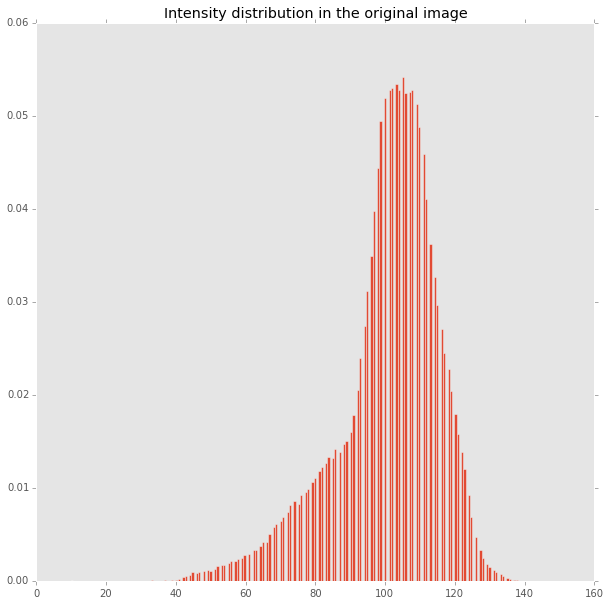

In [60]:
_ = hist(ravel(img), 200, normed=True)
title('Intensity distribution in the original image')

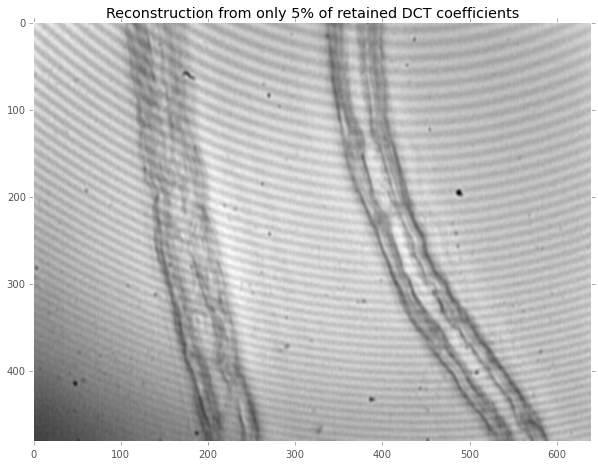

In [61]:
img_rec2 = idct2d(out * (abs(out) >= percentile(abs(out), 95)))
imshow(img_rec2); title('Reconstruction from only 5% of retained DCT coefficients')

## Преобразование Радона (Radon transform)


In [62]:
from skimage.transform import radon, rescale

In [63]:
theta = np.linspace(0., 180., max(img.shape), endpoint=False)
sinogram = radon(img, theta=theta)

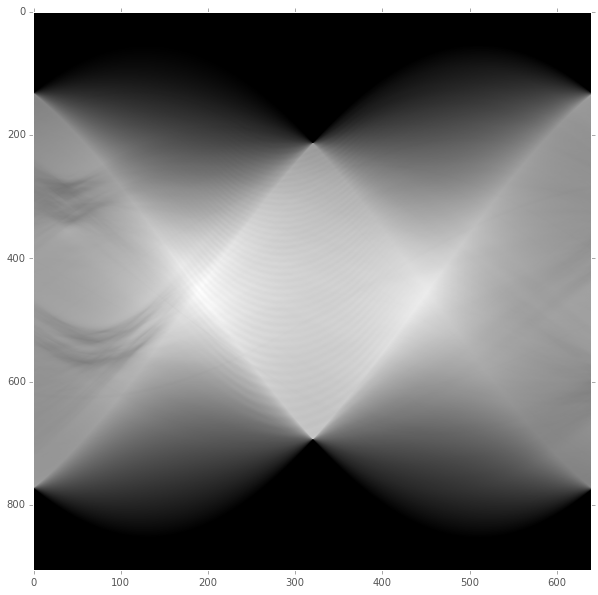

In [64]:
imshow(sinogram, aspect='auto')

## Hough transform

<font color='red'> to be added </font>

## More patch-based methods


<font color=red> to be extended later </font>

### patch-based DCT denoising

In [65]:
from skimage.util.shape import view_as_windows
from skimage.util.montage import montage2d

def image_to_patches(m,patch_shape=(8,8)):
    new_shape = m.shape + array(patch_shape)
    nrows,ncols = m.shape
    out = np.zeros(new_shape)
    ph,pw = patch_shape
    hph, hpw = ph/2, pw/2
    im_slice = tuple([slice(s/2,-s/2) for s in patch_shape])
    out[im_slice] = m
    # Constant-value padding
    out[hph:-hph,:hpw] = m[:,0].reshape(-1,1)
    out[hph:-hph,-hpw:] = m[:,-1].reshape(-1,1)
    out[-hpw:,hph:hpw+ncols] = m[0,:].reshape(1,-1)
    out[-hpw:,hph:hpw+ncols] = m[-1,:].reshape(1,-1)
    out_sh = tuple(map(slice, m.shape))
    return view_as_windows(out, patch_shape)[out_sh].reshape(-1 , *patch_shape)

In [66]:
def image_from_patches(patches, 
                       im_shape=(512,512), 
                       patch_shape=(8,8),
                       wsigma=3.):
    patches = patches.reshape(-1, *patch_shape)
    new_shape = im_shape + array(patch_shape)
    out = np.zeros(new_shape)
    im_slice = tuple([slice(s/2,-s/2) for s in patch_shape])
    
    ph,pw = patch_shape
    hph, hpw = ph/2, pw/2
    l1,l2 = ph%2,pw%2
    
    kern = make_weighting_kern(patch_shape[0], sigma=wsigma)
    kmean = kern.mean()
    
    k = 0
    for row in xrange(hph,new_shape[0]-hph-l1):
        for col in xrange(hpw,new_shape[1]-hpw-l2):
            out[row-hph:row+hph+l1,
                col-hpw:col+hpw+l2] += patches[k]*kern
            k+=1
    out /= prod(patch_shape)*kmean
    return out[hph:hph+im_shape[0],hpw:hpw+im_shape[1]]

0.528968295323
(6, 6)


<matplotlib.colorbar.Colorbar instance at 0x7fc0c3002440>

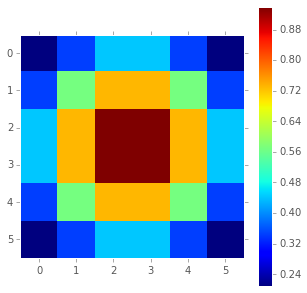

In [67]:
def make_weighting_kern(size=8, sigma=3.):
    x,y = mgrid[-size/2.+0.5:size/2.+.5,-size/2.+.5:size/2.+.5]
    sigma = float(sigma)
    g = np.exp(-(0.5*(x/sigma)**2 + 0.5*(y/sigma)**2))
    return g
kern = make_weighting_kern(6,sigma=2.)
print kern.mean()
print kern.shape
figure(figsize=(5,5))
imshow(kern.T, cmap='jet', interpolation='nearest'); colorbar()
#axvline(7.5, color='white')
#axhline(7.5, color='white')

In [68]:
from scipy.fftpack import dct, idct
def dct2d(m,norm='ortho'):
    return dct(dct(m, norm=norm, axis=0), 
               norm=norm, axis=1)
def dct2d(m,norm='ortho'):
    return dct(dct(m, norm=norm, axis=0), 
               norm=norm, axis=1)    

def idct2d(m,norm='ortho'):
    return idct(idct(m, norm=norm, axis=0), 
               norm=norm, axis=1)    

In [69]:
from scipy.fftpack import dct, idct
def dct_denoise_gray(image, threshold, patch_shape=(8,8),wsigma=3.):
    patches = image_to_patches(image, patch_shape)
    thresholdfn = lambda p: np.where(np.abs(p)>threshold, p, 0)
    dctpatches = dct(dct(patches, axis=1, norm='ortho'), 
                     axis=2, norm='ortho')
    recpatches = idct(idct(thresholdfn(dctpatches), axis=1, norm='ortho'), 
                      axis=2, norm='ortho')
    out = image_from_patches(recpatches,image.shape,patch_shape,wsigma=wsigma)
    return out


color_basis = np.array([[1./3**0.5]*3,
                        [1./2**0.5, 0, -1./2.**0.5],
                        [1./6**0.5, -2./6**0.5, 1./6**0.5]]).T

def dct_denoise(image, *args, **kwargs):
    """DCT image denoising as described at www.ipol.im/pub/art/2011/ys-dct/"""
    if np.ndim(image) == 3:
        # color projection and channel splitting:
        cproj = color_basis.dot(image.reshape(-1,3).T).T
        cproj = cproj.reshape(image.shape)
        channels =[cproj[...,k] for k in range(3)]
        # denoising in each channel
        out = [dct_denoise_gray(c, *args, **kwargs) for c in channels]
        out =  np.dstack(out)
        # projection to normal colors again
        out = out.reshape(-1,3).dot(color_basis)
        # clip values to stay within expected range
        vmax = np.any(image > 1) and 255 or 1.0
        out = np.where(out<0, 0, out)
        out = np.where(out > 1, vmax, out)
    elif np.ndim(image) == 2:
        out = dct_denoise_gray(image, *args, **kwargs)
    else:
        print "Don't know how to process images of this dimensionality"
        return None
    return out.reshape(image.shape)

In [70]:
%time slot_den = dct_denoise_gray(slot_noisy, slot_noisy.mean()+3*std(slot_noisy))

CPU times: user 11.5 s, sys: 456 ms, total: 12 s
Wall time: 12 s


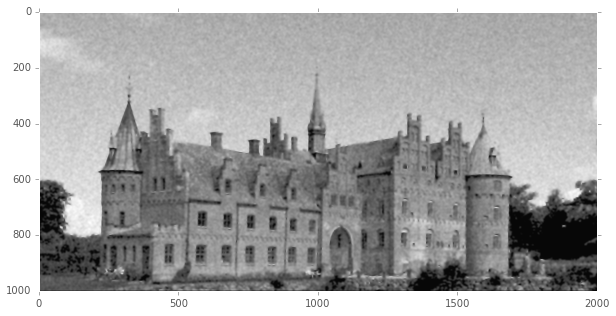

In [71]:
imshow(slot_den)

(<matplotlib.image.AxesImage at 0x7fc0c2d08110>,
 <matplotlib.text.Text at 0x7fc0c2d50410>)

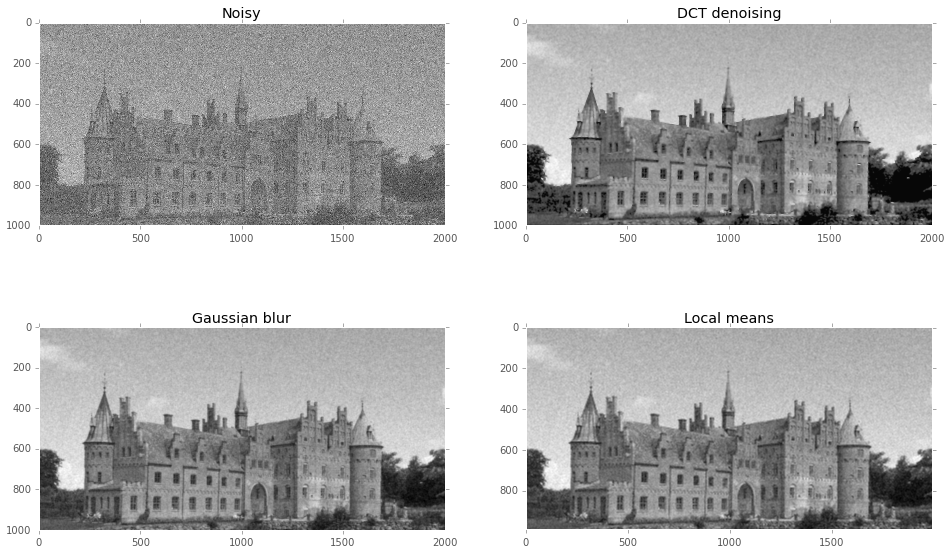

In [72]:
f, axs = subplots(2,2, figsize=(16,10))
axs = axs.ravel()
axs[0].imshow(slot_noisy),axs[0].set_title('Noisy') 
axs[1].imshow(slot_den), axs[1].set_title('DCT denoising')
axs[2].imshow(slot_g1), axs[2].set_title('Gaussian blur')
axs[3].imshow(slot_lm2), axs[3].set_title('Local means')

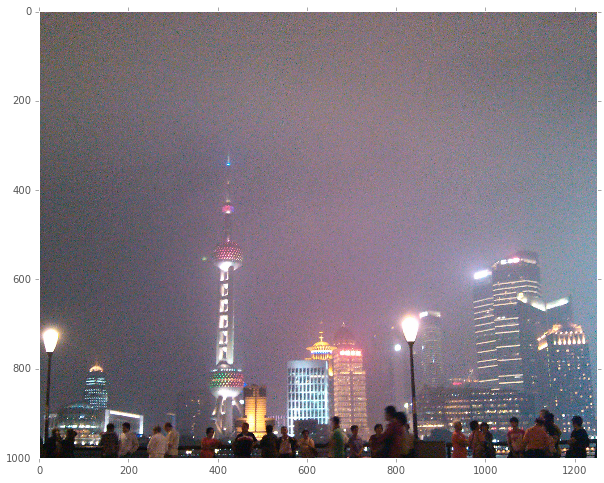

In [73]:
shang = imread('images/shanghai.jpg')[:2000:2,500:3000:2,...]
imshow(shang)

In [74]:
%time shang_r = dct_denoise(shang/255., (3.*std(shang))/255.)

CPU times: user 21.6 s, sys: 784 ms, total: 22.4 s
Wall time: 22.4 s


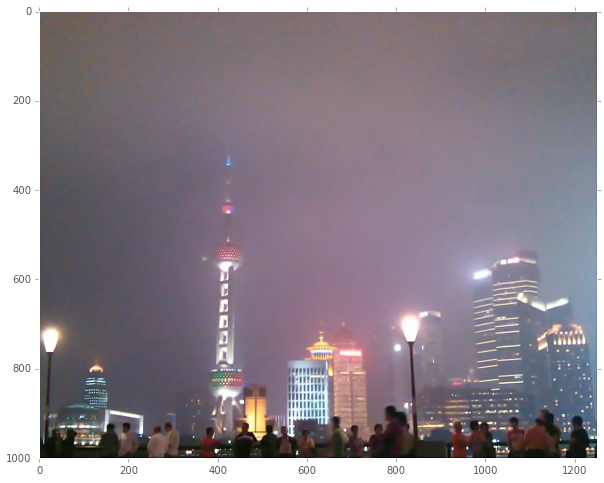

In [75]:
imshow(shang_r)

## Non-local means
<font color='red'> to be added </font>